# Caltech-UCSD Birds-200-2011 (CUB) - Reader Writer class

### This ipynb presents CUB reader and writer class and sample usage

Goal -
    read downloaded CUB data files into data structure 
    expose simple data acess methods
    add images sizes data
    expose csv writer method to write the data into single csv file
    
prerequesits (includes image draw bounding boxes and image display)-
    numpy,
    os,
    cv2,
    csv,
    pandas,
    PIL,
    matplotlib,
    pprint,

inputs -
    CUB_PATH # (class init) path to original download folder
    CSV_PATH # (csv write method) csv file path for writer
       
class methods -
    getCubSize()              # CUB database size  (int)
    getImages()               # CUB images list    (dictionary 'image number' : 'image path')
    getImagesSizes()          # CUB images sizes   (dictionary 'image number' : \['width','height'\])
    getBoxes()                # CUB bounding boxes (dictionary 'image number' : \['xcenter','ycenter', 'width', 'height\])
    getImgClasses()           # CUB images classes (dictionary 'image number' : 'class number')
    getClasses()              # CUB classes names  (dictionary 'class number' : 'class name')
    writeCubToCsv(file path)  # write to csv, 
        file format : 
            csv header row,
            row :
                image path,
                image size,
                image class name,
                bounding box xmin,
                bounding box ymin,
                bounding box xmax,
                bounding box ymax,
usage - 
       cub = CUB_ReadWrite(folde path)  # inialize class read all CU data files from 'folder path'
       cub.{method()}                   # returns methods CUB data as described above
       cub.writeCubToCsv(file path)     # writes csv file to 'file path' in format decribed above
       del(cub)                         # deletes object
    
see below in usage sample section (very) simple csv read and display images using csv, pandas, PIL packages

## Imports

In [1]:
import numpy as np
import os
import csv
import cv2
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt
import pprint

## Globals

In [2]:
#CUB_PATH = "D:/Google-Drive/Technology/airboat/ML/Birds-DS/CUB-1"
CUB_PATH = "D:/Google-Drive/Technology/airboat/ML/Birds-DS/CUB_200_2011/CUB_200_2011/CUB_200_2011"

#CSV_PATH = "cub_csv.txt"
CSV_PATH = "D:/Google-Drive/Technology/airboat/ML/Images/train/birds_labels.csv"
PROCESS_CUB = False

## Helpers

In [3]:
def draw_box(csvData,line):
    selected_value = csvData[csvData.index == line]
    for index, row in selected_value.iterrows():
        img = cv2.imread(row['filename'])
        img = cv2.rectangle(img, (row['xmin'], row['ymin']), (row['xmax'], row['ymax']), (0, 0, 0), 1)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img,row['class'],(row['xmin'],row['ymin']), font, 1,(0,0,0),1)
    return img

def getCsv(csvPath):
    csvData =  pd.read_csv(csvPath)
    #csvData.head()
    return csvData

## CUB to csv class

In [4]:
class CUB_ReadWrite:
    
    def __init__(self,cubPath):
        IMAGES_FILE   = "images.txt"
        BBOX_FILE     = "bounding_boxes.txt"
        IMGCLASS_FILE = "image_class_labels.txt"
        CLASSES_FILE  = "classes.txt"
        
        self.cubPath = cubPath
        self.imgTxtPath = os.path.join(cubPath,IMAGES_FILE)
        self.bbTxtPath = os.path.join(cubPath,BBOX_FILE)
        self.imgClassPath = os.path.join(cubPath,IMGCLASS_FILE)
        self.classesPath = os.path.join(cubPath,CLASSES_FILE)
        self.imgList,self.imgDict,self.imgSizesDict = self._readImgTxt()
        self.bboxDict = self._readBB()
        self.imgClassDict = self._readImgClass()
        self.classesDict = self._readClasses()
        
    def _getImgSize(self,imgPath):
        im = Image.open(imgPath)
        return im.size

    def _readImgTxt(self):
        imgList = []
        imgDict = {}
        imgSizesDict = {}
        with open(self.imgTxtPath) as f:
            spamreader = csv.reader(f, delimiter=' ')
            for row in spamreader:
                imgList.append(int(row[0]))
                imgPath = os.path.join('images',row[1])
                width,height = self._getImgSize(imgPath)
                imgDict[int(row[0])] = imgPath
                imgSizesDict[int(row[0])] = [width,height]
        return imgList,imgDict,imgSizesDict

    def _readBB(self):
        bbDict = {}
        with open(self.bbTxtPath) as f:
            spamreader = csv.reader(f, delimiter=' ')
            for row in spamreader:
                bbDict[int(row[0])] = [ int(float(x)) for x in row[1:5] ]
        return bbDict

    def _readImgClass(self):
        imgClassDict = {}
        with open(self.imgClassPath) as f:
            spamreader = csv.reader(f, delimiter=' ')
            for row in spamreader:
                imgClassDict[int(row[0])] = int(row[1])  #offset by 0 
                #self.train_labels_dict[int(row[0])] = (int(row[1]) -1 )/ 20 #offset by 0 
        return imgClassDict

    def _readClasses(self):
        classDict = {}
        with open(self.classesPath) as f:
            spamreader = csv.reader(f, delimiter=' ')
            for row in spamreader:
                classDict[int(row[0])] = row[1]
        return classDict
    
    def getImages(self):
        return self.imgDict
   
    def getImagesSizes(self):
        return self.imgSizesDict
    
    def getBoxes(self):
        return self.bbDict
    
    def getImgClasses(self):
        return self.imgClassDict
    
    def getClasses(self):
        return self.classesDict
    
    def getCubSize(self):
        return len(self.imgList)    
    
    def writeCubToCsv(self,csvFilePath):
        with open(csvFilePath, 'w') as csvfile:
            fieldnames = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
            writer.writeheader()
            for k in self.imgList:
                i = k -1
                #print(i)
                imgPath = os.path.join(self.cubPath, self.imgDict[self.imgList[i]])
                width  = self.imgSizesDict[self.imgList[i]][0]
                height = self.imgSizesDict[self.imgList[i]][1] 
                imgClass = self.classesDict[self.imgClassDict[self.imgList[i]]]
                xmin = int(self.bboxDict[self.imgList[i]][0])
                ymin = int(self.bboxDict[self.imgList[i]][1])
                xmax = int(self.bboxDict[self.imgList[i]][0] + self.bboxDict[self.imgList[i]][2])
                ymax = int(self.bboxDict[self.imgList[i]][1] + self.bboxDict[self.imgList[i]][3])
                writer.writerow({'filename' : imgPath,'width' : width, 'height' : height,'class' : imgClass,'xmin' : xmin,\
                     'ymin' : ymin,'xmax' : xmax,'ymax' : ymax})
    

## Usage sample

In [5]:
if (PROCESS_CUB):   # enables reloading the notebook wothout reading the data (csv read only)
    cub = CUB_ReadWrite(CUB_PATH)
    pprint.pprint(cub.getCubSize())
    pprint.pprint(cub.getImages())
    pprint.pprint(cub.getImagesSizes())

In [6]:
if (PROCESS_CUB):    
    cub.getCubSize()

In [7]:
if (PROCESS_CUB):
    cub.getImages()

In [8]:
if (PROCESS_CUB):
    cub.getImagesSizes()

In [9]:
if (PROCESS_CUB):
    cub.getImgClasses()

In [10]:
if (PROCESS_CUB):
    cub.getClasses()

In [11]:
if (PROCESS_CUB):
    cub.writeCubToCsv(CSV_PATH)

In [12]:
if (PROCESS_CUB):
    del(cub)

In [13]:
csvData = getCsv(CSV_PATH)
csvData.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,D:\Google-Drive\Technology\airboat\ML\Images\t...,5166,3444,pelican,2387,1571,2720,1988
1,D:\Google-Drive\Technology\airboat\ML\Images\t...,5166,3444,bird,5040,1150,5144,1214
2,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,pelican,2396,1585,2760,1827
3,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,535,1214,588,1244
4,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,294,997,349,1029
5,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,513,999,545,1027
6,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,3749,1325,3822,1356
7,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,3660,1321,3746,1351
8,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,pelican,2346,1685,2724,1877
9,D:\Google-Drive\Technology\airboat\ML\Images\t...,5184,3456,bird,4671,1294,4787,1394


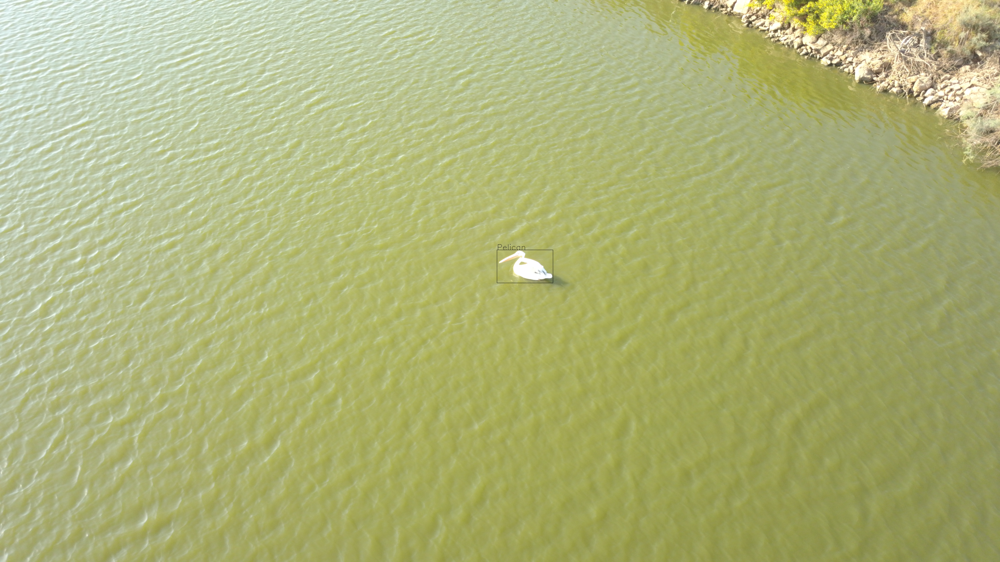

In [14]:
imgNum = 393
pilImage = Image.fromarray(cv2.cvtColor(draw_box(csvData,imgNum),cv2.COLOR_BGR2RGB))
pilImage

In [15]:
pilImage.show()